**Nuclei segmentation in whole slide H&E images**

using pre-trained StarDist model.

In [1]:
!pip install stardist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.3/71.3 kB 9.5 MB/s eta 0:00:00


In [2]:
# To read Tiff files on Colab we need to install imagecodecs library
!pip install imagecodecs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.5/39.5 MB 13.6 MB/s eta 0:00:00


In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from PIL import Image
from csbdeep.utils import Path, normalize
from csbdeep.utils.tf import keras_import
keras = keras_import()

from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D

np.random.seed(0)
cmap = random_label_cmap()

In [157]:
img = np.array(Image.open(r"D:\\VIT Material\\VIT material\\Hepatoma Research Project\\Test-Images\\monuseg_test_folder\\img\\0002.png"))
gt = np.array(Image.open(r"D:\\VIT Material\\VIT material\\Hepatoma Research Project\\Test-Images\\monuseg_test_folder\\labelcol\\0002.png"))

In [158]:
img.shape, gt.shape

((256, 256, 3), (256, 256))

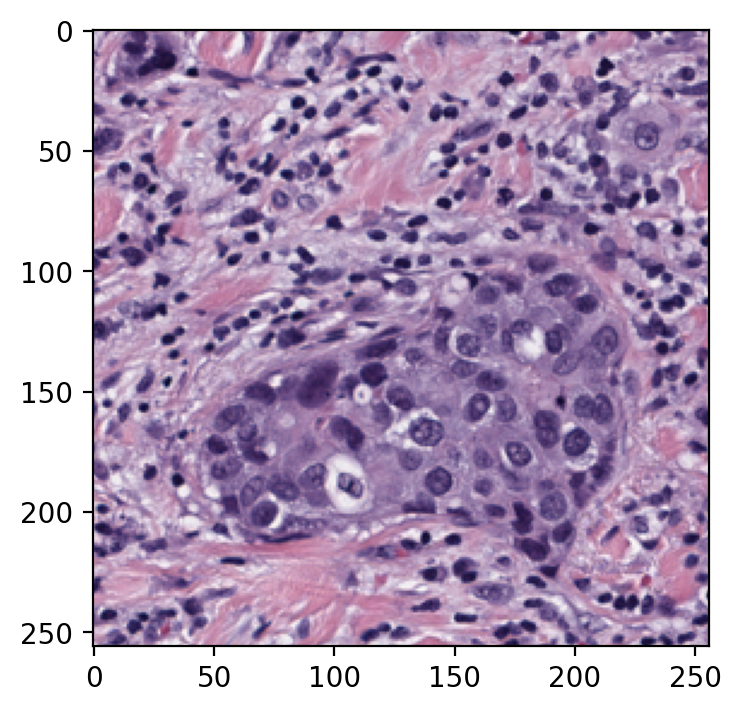

In [149]:
plt.figure(figsize=(4, 4))
plt.imshow(img)

In [150]:
model = StarDist2D.from_pretrained('2D_versatile_he')

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [151]:
img = normalize(img, 1, 99.8)
normalizer = None

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94


100%|██████████| 169/169 [00:13<00:00, 12.10it/s]

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(16, 16, 0)
Y: context of 16 is small, recommended to use at least 94
X: context of 16 is small, recommended to use at least 94



100%|██████████| 49/49 [00:03<00:00, 13.22it/s]


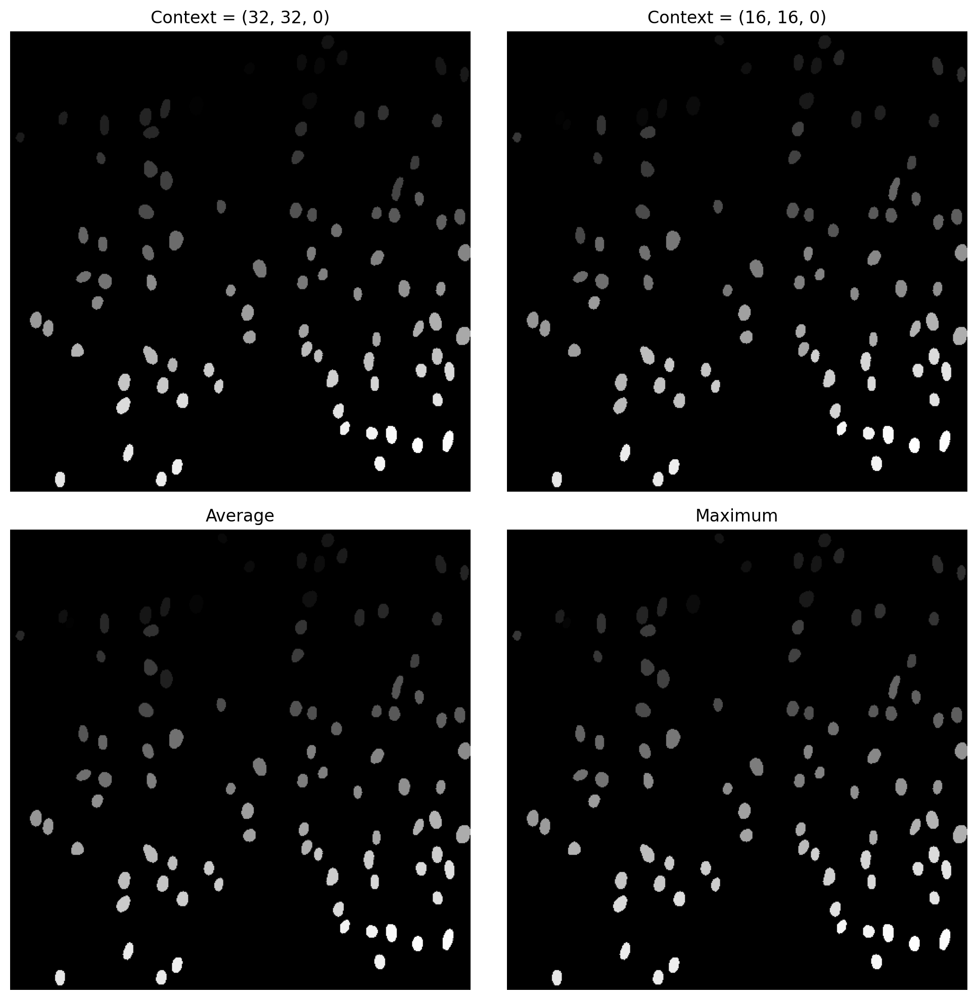

In [142]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 10))  # Adjust figsize as needed

#Slow - takes time to segment the large image
labels1, polys = model.predict_instances_big(img, axes='YXC', block_size=128, min_overlap=32, context=32,
                                            normalizer=normalizer, n_tiles=(2,2,1))
# Plot each image on a subplot
axs[0, 0].imshow(labels1.astype(np.uint8), cmap="grey")
axs[0, 0].set_title("Context = (32, 32, 0)")

#Slow - takes time to segment the large image
labels2, polys = model.predict_instances_big(img, axes='YXC', block_size=128, min_overlap=32, context=16,
                                            normalizer=normalizer, n_tiles=(2,2,1))
axs[0, 1].imshow(labels2.astype(np.uint8), cmap="grey")
axs[0, 1].set_title("Context = (16, 16, 0)")





axs[1, 0].imshow(((labels1+labels2)/2).astype(np.uint8), cmap="grey")
axs[1, 0].set_title("Average")

axs[1, 1].imshow((np.maximum(labels1, labels2)).astype(np.uint8), cmap="grey")
axs[1, 1].set_title("Maximum")

# Remove axis ticks for cleaner display
for ax in axs.ravel():
    ax.axis('off')

# Display the plots
plt.tight_layout()  # Optional: Adjusts subplot params so that the subplot(s) fits in to the figure area.
plt.show()

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


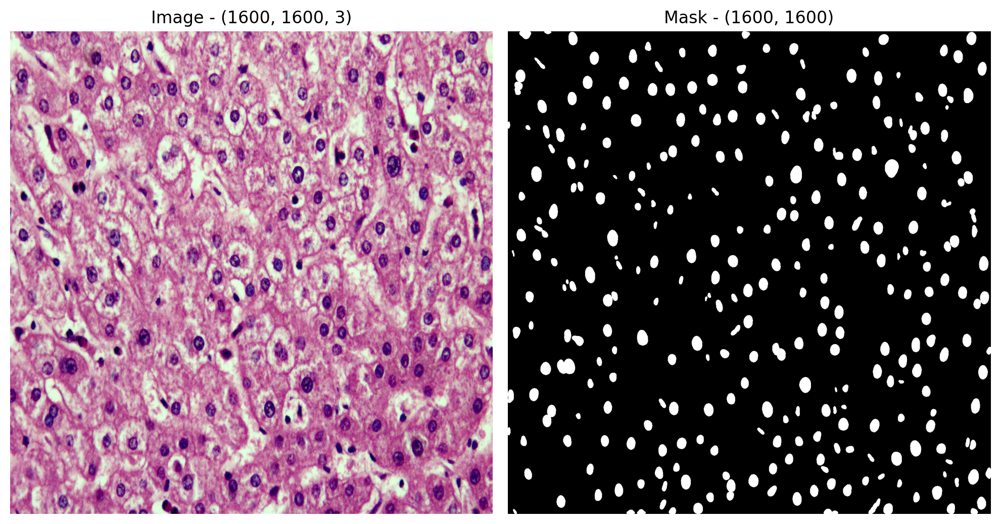

In [6]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 10))  # Adjust figsize as needed

img = np.array(Image.open(r"D:\\VIT Material\\VIT material\\Hepatoma Research Project\\Histopathology-Images\Samp2\Samp2_image_0.jpg").resize((1600, 1600)))

model = StarDist2D.from_pretrained('2D_versatile_he')
img = normalize(img, 1, 99.8)

#Slow - takes time to segment the large image
labels, _ = model.predict_instances(img, prob_thresh=0.20)
thresh = 0
labels[labels > thresh] = 1
labels = (labels * 255).astype('uint8')

# Plot each image on a subplot
axs[0].imshow(img)
axs[0].set_title(f"Image - {img.shape}")

axs[1].imshow(labels, cmap='grey')
axs[1].set_title(f"Mask - {labels.shape}")

# Remove axis ticks for cleaner display
for ax in axs.ravel():
    ax.axis('off')

# Display the plots
plt.tight_layout()  # Optional: Adjusts subplot params so that the subplot(s) fits in to the figure area.
plt.show()

In [231]:
Image.fromarray((labels * 255).astype('uint8')).show()

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


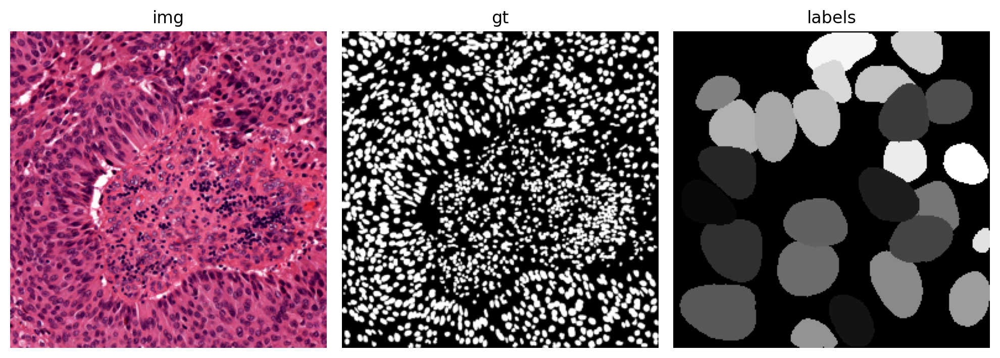

In [198]:
img = np.array(Image.open(r"D:\\VIT Material\\VIT material\\Hepatoma Research Project\\Test-Images\\train_folder\\img\\0017.png"))
gt = np.array(Image.open(r"D:\\VIT Material\\VIT material\\Hepatoma Research Project\\Test-Images\\train_folder\\labelcol\\0017.png"))

model = StarDist2D.from_pretrained('2D_versatile_he')
img = normalize(img, 1, 99.8)

#Slow - takes time to segment the large image
labels, _ = model.predict_instances(img, prob_thresh=0.25)
# thresh = 0.8
# labels[labels > thresh] = 1
# labels[labels <= thresh] = 0

# Load the images into numpy arrays
titles = ['img', 'gt', 'labels']
images = [img, gt, labels]

# Plot the images side by side
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

for idx, (ax, f) in enumerate(zip(axes, images)):
    ax.imshow(f, cmap="grey")
    ax.axis('off')
    ax.set_title(titles[idx])

plt.tight_layout()
plt.show()

In [183]:
def dice(im1, im2):
    """
    Computes the Dice coefficient, a measure of set similarity.

    Parameters
    ----------
    im1 : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    im2 : array-like, bool
        Any other array of identical size. If not boolean, will be converted.

    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0

    Notes
    -----
    The order of inputs for `dice` is irrelevant. The result will be
    identical if `im1` and `im2` are switched.
    """
    im1 = np.asarray(im1).astype(bool)  # Changed from np.bool to bool
    im2 = np.asarray(im2).astype(bool)  # Changed from np.bool to bool

    if im1.shape!= im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)
    return 2. * intersection.sum() / (im1.sum() + im2.sum())


dice_coefficient = dice(gt, labels)
print("Dice Coefficient:", dice_coefficient)


Dice Coefficient: 0.6816942268639397


Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94


100%|██████████| 169/169 [00:13<00:00, 12.79it/s]

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94



100%|██████████| 169/169 [00:13<00:00, 12.65it/s]

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94



100%|██████████| 169/169 [00:13<00:00, 12.74it/s]

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94



100%|██████████| 169/169 [00:13<00:00, 12.62it/s]

effective: block_size=(128, 128, 3), min_overlap=(32, 32, 0), context=(32, 32, 0)
Y: context of 32 is small, recommended to use at least 94
X: context of 32 is small, recommended to use at least 94



100%|██████████| 169/169 [00:13<00:00, 12.11it/s]


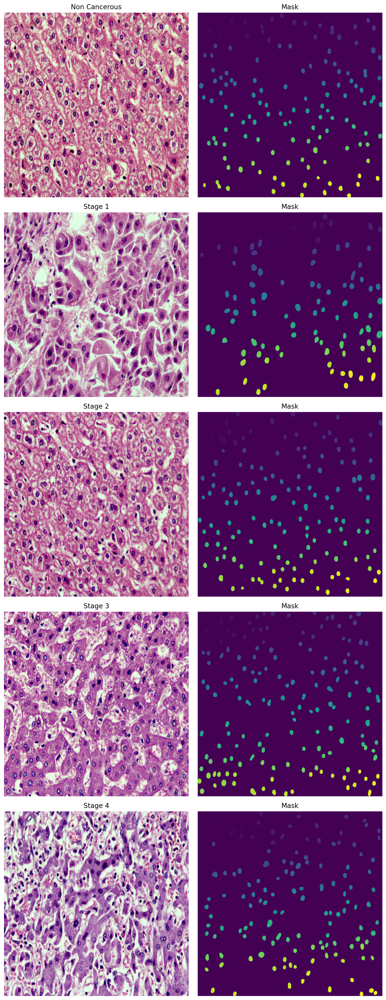

In [30]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

normalizer = None

# Define the paths to your images
img_paths = ['/content/K1180001.JPG', '/content/K1180002.JPG', '/content/K1180062.JPG', '/content/K1310003.JPG', '/content/K1250048.JPG']
model = StarDist2D.from_pretrained('2D_versatile_he')

# Function to load image and convert to numpy array
def load_image(img_path):
    img = Image.open(img_path).resize((512, 512))
    img = np.array(img)
    return normalize(img, 1, 99.8)

# Load images
images = [load_image(img_path) for img_path in img_paths]
preds = []

for img in images:
  labels, polys = model.predict_instances_big(img, axes='YXC', block_size=128, min_overlap=32, context=32, normalizer=normalizer, n_tiles=(4,4,1))
  preds.append(labels)

# Create a figure with 5 rows and 2 columns
fig, axs = plt.subplots(5, 2, figsize=(10, 25))

# Plot images and their predictions
for i in range(5):
    # Plot the image
    axs[i, 0].imshow(images[i])
    axs[i, 0].axis('off')
    if i==0:
      axs[i, 0].set_title(f'Non Cancerous')
    elif i==1:
      axs[i, 0].set_title(f'Stage 1')
    elif i==2:
      axs[i, 0].set_title(f'Stage 2')
    elif i==3:
      axs[i, 0].set_title(f'Stage 3')
    else:
      axs[i, 0].set_title(f'Stage 4')

    # Plot the prediction (for illustration, assume prediction is also an image)
    axs[i, 1].imshow(preds[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f'Mask')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()
